<a href="https://colab.research.google.com/github/Draavos/making-it-rain/blob/main/analysis_protein_2ligand.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title **Install Conda Colab**
#@markdown It will restart the kernel (session), don't worry.
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.1.0-1/Mambaforge-23.1.0-1-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:20
🔁 Restarting kernel...


In [ ]:
#@title **Install dependencies**
#@markdown It will take a few minutes, please, drink a coffee and wait. ;-)
# install dependencies
%%capture
import sys
!pip -q install py3Dmol
!pip install --upgrade MDAnalysis 2>&1 1>/dev/null
!pip install git+https://github.com/pablo-arantes/biopandas
!pip install rdkit-pypi
!pip install Cython
!mamba install openmmforcefields -c conda-forge -y
!pip install prolif==1.1.0
!mamba install -c conda-forge openbabel -y
!mamba install -c conda-forge ambertools -y
!mamba install -c conda-forge parmed -y
!pip install --upgrade MDAnalysis

#load dependencies
from openmm import app, unit
from openmm.app import HBonds, NoCutoff, PDBFile
from openff.toolkit.topology import Molecule, Topology
from openff.toolkit.typing.engines.smirnoff import ForceField
from openff.toolkit.utils import get_data_file_path
import parmed as pmd
from biopandas.pdb import PandasPdb
import openmm as mm
from openmm import *
from openmm.app import *
from openmm.unit import *
import os
import urllib.request
import numpy as np
import MDAnalysis as mda
import py3Dmol
import pytraj as pt
import platform
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
import scipy.stats as stats
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import griddata
import seaborn as sb
from statistics import mean, stdev
from pytraj import matrix
from matplotlib import colors
from IPython.display import set_matplotlib_formats
# !wget  https://raw.githubusercontent.com/openforcefield/openff-forcefields/master/openforcefields/offxml/openff_unconstrained-2.0.0.offxml

In [ ]:
#@title ### **Import Google Drive**
#@markdown Click in the "Run" buttom to make your Google Drive accessible.
from google.colab import drive

drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
#@title **Please, provide the necessary input files below**:
#@markdown **Important:** The protonation of your ligand is crucial for the correct parameterization of the molecule.
%%capture
import rdkit
import mdtraj as md
from rdkit import Chem
from rdkit.Chem import AllChem,Draw
from rdkit.Chem.Draw import IPythonConsole

Google_Drive_Path = '/content/drive/MyDrive/protein_ligand/12-1' #@param {type:"string"}
workDir = Google_Drive_Path


In [ ]:
#@title **if already concatenate**
#@markdown **Important**: The **Google Drive Path**, **Jobname**, **Number of strides**, **stride time** and **trajectory saved frequency** should be the same you have been used to run your simulation in the previous steps.

import MDAnalysis as mda
from MDAnalysis.analysis import align, rms

Google_Drive_Path = '/content/drive/MyDrive/protein_ligand/53-11' #@param {type:"string"}
workDir = Google_Drive_Path
Equilibrated_PDB = 'prot_lig_equil.pdb' #@param {type:"string"}
Jobname = "prot_lig_prod" #@param {type: "string"}
Skip = "1" #@param ["1", "2", "5", "10", "20", "50"]
stride_traj = Skip
Output_format = "dcd" #@param ["dcd", "pdb", "trr", "xtc"]
first_stride = "1" #@param {type:"string"}
Number_of_strides = "10" #@param {type:"string"}
nstride = int(Number_of_strides)
stride_time = "10" #@param {type:"string"}
trajectory_saved_frequency = "100" #@param ["10", "100", "200", "500", "1000"]
traj_save_freq = trajectory_saved_frequency
Remove_waters = "yes" #@param ["yes", "no"]
# stride_id_as_ref_for_alignment = "1" #@param {type: "string"}
output_prefix = first_stride+"-"+str(int(first_stride)+nstride-1)

stride_time_ps = float(stride_time)*1000
simulation_time_analysis = stride_time_ps*nstride
simulation_ns = float(stride_time)*int(Number_of_strides)
number_frames = int(simulation_time_analysis)/int(traj_save_freq)
number_frames_analysis = number_frames/int(stride_traj)


# traj_end = os.path.join(workDir, str(Jobname) + "_all.dcd")
nw_dcd = os.path.join(workDir, str(Jobname) + output_prefix + "_nw." + str(Output_format))
nw_pdb = os.path.join(workDir, str(Jobname) +  "_nw.pdb")
whole_pdb = os.path.join(workDir, str(Jobname) +  "_whole.pdb")
# traj_end2 = os.path.join(workDir, str(Jobname) + "_all." + str(Output_format))
whole_dcd = os.path.join(workDir, str(Jobname) + output_prefix + "_whole." + str(Output_format))
template =  os.path.join(workDir, str(Jobname) + '_%s.dcd')
pdb = os.path.join(workDir, Equilibrated_PDB)

flist = [template % str(i) for i in range(int(first_stride), int(first_stride) + nstride)]
ref = [template % int(1)]

u1 = mda.Universe(os.path.join(workDir, "SYS_gaff2.prmtop"), flist)
u2 = mda.Universe(os.path.join(workDir, "SYS_gaff2.prmtop"), ref)

u2.trajectory[0] # set u2 to first frame

# print(rms.rmsd(u1.select_atoms('name CA').positions, u2.select_atoms('name CA').positions, superposition=False))

align.AlignTraj(u1, u2, select='name CA', in_memory=True).run()

whole = u2.select_atoms("all")
traj_dcd_check = os.path.exists(whole_dcd)
traj = whole_dcd
pdb_ref = whole_pdb
traj_gaff = pt.load(traj, os.path.join(workDir, "SYS_gaff2.prmtop"))

nw = u1.select_atoms("not (resname WAT)")

traj_load = pt.load(traj, pdb_ref)
print(traj_load)

if traj_dcd_check == True:
  print("Trajectory concatenated successfully! :-)")
else:
  print("ERROR: Check your inputs! ")

In [ ]:
#@markdown ### **Provide input file names below:**

Equilibrated_PDB = 'prot_lig_equil.pdb' #@param {type:"string"}
State_file = 'prot_lig_equil.rst' #@param {type:"string"}

#@markdown ---
#@markdown ### **Parameters for MD Production protocol:**


# remove whitespaces
Jobname = 'prot_lig_prod' #@param {type:"string"}

Ligand_Force_field = "GAFF2" #@param ["GAFF2", "OpenFF 2.0.0 (Sage)"]

if Ligand_Force_field == "OpenFF 2.0.0 (Sage)":
  top = os.path.join(workDir, "SYS_openff.prmtop")
  crd = os.path.join(workDir, "SYS_openff.inpcrd")
  pdb = os.path.join(workDir, "SYS.pdb")

else:
  top = os.path.join(workDir, "SYS_gaff2.prmtop")
  crd = os.path.join(workDir, "SYS_gaff2.crd")
  pdb = os.path.join(workDir, "SYS.pdb")


#@markdown Simulation time (in nanoseconds), number of strides (integers) and integration timestep (in femtoseconds):
Stride_Time = "10" #@param {type:"string"}
stride_time_prod = Stride_Time
Number_of_strides = "11" #@param {type:"string"}
nstride = Number_of_strides
Integration_timestep = "2" #@param ["0.5", "1", "2", "3", "4"]
dt_prod = Integration_timestep

#@markdown Temperature (in Kelvin) and Pressure (in bar)
Temperature = "303" #@param {type:"string"}
temperature_prod = Temperature
Pressure = 1 #@param {type:"string"}
pressure_prod = Pressure

#@markdown Frequency to write the trajectory file (in picoseconds):
Write_the_trajectory = "100" #@param ["10", "100", "200", "500", "1000"]
write_the_trajectory_prod = Write_the_trajectory

#@markdown Frequency to write the log file (in picoseconds):
Write_the_log = "200" #@param ["10", "100", "200", "500", "1000"]
write_the_log_prod = Write_the_log

#@markdown ---

In [ ]:
#@title **Concatenate and align the trajectory**
#@markdown **Important**: The **Google Drive Path**, **Jobname**, **Number of strides**, **stride time** and **trajectory saved frequency** should be the same you have been used to run your simulation in the previous steps.

import MDAnalysis as mda
from MDAnalysis.analysis import align, rms
import pytraj as pt


Google_Drive_Path = '/content/drive/MyDrive/protein_ligand/12-1' #@param {type:"string"}
workDir = Google_Drive_Path
Equilibrated_PDB = 'prot_lig_equil.pdb' #@param {type:"string"}
Jobname = "prot_lig_prod" #@param {type: "string"}
Skip = "1" #@param ["1", "2", "5", "10", "20", "50"]
stride_traj = Skip
Output_format = "dcd" #@param ["dcd", "pdb", "trr", "xtc"]
first_stride = "1" #@param {type:"string"}
Number_of_strides = "11" #@param {type:"string"}
nstride = int(Number_of_strides)
stride_time = "10" #@param {type:"string"}
trajectory_saved_frequency = "100" #@param ["10", "100", "200", "500", "1000"]
traj_save_freq = trajectory_saved_frequency
Remove_waters = "yes" #@param ["yes", "no"]
# stride_id_as_ref_for_alignment = "1" #@param {type: "string"}
output_prefix = first_stride+"-"+str(int(first_stride)+nstride-1)

stride_time_ps = float(stride_time)*1000
simulation_time_analysis = stride_time_ps*nstride
simulation_ns = float(stride_time)*int(Number_of_strides)
number_frames = int(simulation_time_analysis)/int(traj_save_freq)
number_frames_analysis = number_frames/int(stride_traj)


# traj_end = os.path.join(workDir, str(Jobname) + "_all.dcd")
nw_dcd = os.path.join(workDir, str(Jobname) + output_prefix + "_nw." + str(Output_format))
nw_pdb = os.path.join(workDir, str(Jobname) +  "_nw.pdb")
whole_pdb = os.path.join(workDir, str(Jobname) +  "_whole.pdb")
# traj_end2 = os.path.join(workDir, str(Jobname) + "_all." + str(Output_format))
whole_dcd = os.path.join(workDir, str(Jobname) + output_prefix + "_whole." + str(Output_format))
template =  os.path.join(workDir, str(Jobname) + '_%s.dcd')
pdb = os.path.join(workDir, Equilibrated_PDB)

flist = [template % str(i) for i in range(int(first_stride), int(first_stride) + nstride)]
ref = [template % int(1)]

u1 = mda.Universe(os.path.join(workDir, "SYS_gaff2.prmtop"), flist)
u2 = mda.Universe(os.path.join(workDir, "SYS_gaff2.prmtop"), ref)

u2.trajectory[0] # set u2 to first frame

# print(rms.rmsd(u1.select_atoms('name CA').positions, u2.select_atoms('name CA').positions, superposition=False))

align.AlignTraj(u1, u2, select='name CA', in_memory=True).run()

with mda.Writer(whole_dcd, u1.select_atoms("all").n_atoms) as W:
  for ts in u1.trajectory[::int(Skip)]:
      W.write(u1.select_atoms("all"))
whole = u2.select_atoms("all")
whole.write(whole_pdb)
traj_dcd_check = os.path.exists(whole_dcd)
traj = whole_dcd
pdb_ref = whole_pdb
traj_gaff = pt.load(traj, os.path.join(workDir, "SYS_gaff2.prmtop"))

nw = u1.select_atoms("not (resname WAT)")
if Remove_waters == "yes":
  with mda.Writer(nw_dcd, nw.n_atoms) as W:
    for ts in u1.trajectory[::int(Skip)]:
        W.write(nw)
  not_waters = u2.select_atoms("not (resname WAT)")
  not_waters.write(nw_pdb)
  traj_dcd_check = os.path.exists(nw_dcd)
  traj = nw_dcd
  pdb_ref = nw_pdb
else:
  pass

traj_load = pt.load(traj, pdb_ref)
print(traj_load)

if traj_dcd_check == True:
  print("Trajectory concatenated successfully! :-)")
else:
  print("ERROR: Check your inputs! ")

/usr/local/lib/python3.10/site-packages/MDAnalysis/topology/TOPParser.py:295: UserWarning: Unknown ATOMIC_NUMBER value found for some atoms, these have been given an empty element record. If needed these can be guessed using MDAnalysis.topology.guessers.
  warnings.warn(msg)
/usr/local/lib/python3.10/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/usr/local/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:1151: UserWarning: Found no information for attr: 'altLocs' Using default value of ' '
  warnings.warn("Found no information for attr: '{}'"
/usr/local/lib/python3.10/site-packages/MDAnalysis/

pytraj.Trajectory, 1100 frames: 
Size: 0.127213 (GB)
<Topology: 5174 atoms, 415 residues, 114 mols, PBC with box type = orthorhombic>
           
Trajectory concatenated successfully! :-)


In [ ]:
#@title **View and check the Ligand Interaction Network (LigPlot) during MD simulations**
#@markdown This diagram is interactive and allows moving around the residues, as well as clicking the legend to toggle the display of specific residues types or interactions. The diagram will be saved as an HTML file (output.html).

#@markdown **Provide output file names below:**
Output_name = 'Interaction' #@param {type:"string"}

#@markdown The frequency with which an interaction is seen will control the width of the corresponding edge. You can hide the least frequent interactions by using a threshold, i.e. threshold=0.3 will hide interactions that occur in less than 30% of frames.
Threshold = 0.3 #@param {type:"slider", min:0, max:1.0, step:0.1}

import MDAnalysis as mda
import prolif as plf
import numpy as np
import os
from prolif.plotting.network import LigNetwork

# load topology
u = mda.Universe(pdb_ref, traj)
lig = u.select_atoms("resname LIG")
prot = u.select_atoms("protein")

# create RDKit-like molecules for visualisation
lmol = plf.Molecule.from_mda(lig)
pmol = plf.Molecule.from_mda(prot)

if number_frames_analysis > 10:
  stride_animation = number_frames_analysis/10
else:
  stride_animation = 1

fp = plf.Fingerprint()
fp.run(u.trajectory[::int(stride_animation)], lig, prot)
df = fp.to_dataframe(return_atoms=True)

net = LigNetwork.from_ifp(df, lmol,
                          # replace with `kind="frame", frame=0` for the other depiction
                          kind="aggregate", threshold=float(Threshold),
                          rotation=270)
net.save(os.path.join(workDir, Output_name + ".html"))
net.display()

/usr/local/lib/python3.10/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"


  0%|          | 0/10 [00:00<?, ?it/s]

/usr/local/lib/python3.10/site-packages/prolif/utils.py:306: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  df = df.groupby(axis=1, level=["ligand", "protein", "interaction"]).agg(tuple)
/usr/local/lib/python3.10/site-packages/prolif/plotting/network.py:293: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  ifp.applymap(lambda x: x[0]).astype(object), prefix_sep=", "


In [ ]:
#@title **Load, view and check the trajectory**
#@markdown This will take a few minutes. Another coffee would be great. :-)

import warnings
warnings.filterwarnings('ignore')

#py3dmol functions
class Atom(dict):
  def __init__(self, line):
    self["type"] = line[0:6].strip()
    self["idx"] = line[6:11].strip()
    self["name"] = line[12:16].strip()
    self["resname"] = line[17:20].strip()
    self["resid"] = int(int(line[22:26]))
    self["x"] = float(line[30:38])
    self["y"] = float(line[38:46])
    self["z"] = float(line[46:54])
    self["sym"] = line[76:78].strip()

  def __str__(self):
    line = list(" " * 80)
    line[0:6] = self["type"].ljust(6)
    line[6:11] = self["idx"].ljust(5)
    line[12:16] = self["name"].ljust(4)
    line[17:20] = self["resname"].ljust(3)
    line[22:26] = str(self["resid"]).ljust(4)
    line[30:38] = str(self["x"]).rjust(8)
    line[38:46] = str(self["y"]).rjust(8)
    line[46:54] = str(self["z"]).rjust(8)
    line[76:78] = self["sym"].rjust(2)
    return "".join(line) + "\n"

class Molecule(list):
  def __init__(self, file):
    for line in file:
      if "ATOM" in line or "HETATM" in line:
        self.append(Atom(line))

    def __str__(self):
      outstr = ""
      for at in self:
        outstr += str(at)
      return outstr

if number_frames_analysis > 10:
  stride_animation = number_frames_analysis/10
else:
  stride_animation = 1

u = mda.Universe(pdb_ref, traj)

# Write out frames for animation
protein = u.select_atoms('not (resname WAT)')
i = 0
for ts in u.trajectory[0:len(u.trajectory):int(stride_animation)]:
    if i > -1:
        with mda.Writer('' + str(i) + '.pdb', protein.n_atoms) as W:
            W.write(protein)
    i = i + 1
# Load frames as molecules
molecules = []
for i in range(int(len(u.trajectory)/int(stride_animation))):
    with open('' + str(i) + '.pdb') as ifile:
        molecules.append(Molecule(ifile))

models = ""
for i in range(len(molecules)):
  models += "MODEL " + str(i) + "\n"
  for j,mol in enumerate(molecules[i]):
    models += str(mol)
  models += "ENDMDL\n"
#view.addModelsAsFrames(models)

# Animation
view = py3Dmol.view(width=800, height=600)
view.addModelsAsFrames(models)
for i, at in enumerate(molecules[0]):
    default = {"cartoon": {'color': 'spectrum'}}
    view.setViewStyle({'style':'outline','color':'black','width':0.1})
    view.setStyle({'model': -1, 'serial': i+1}, at.get("pymol", default))
    HP = ['LIG']
    view.setStyle({"model":-1,'and':[{'resn':HP}]},{'stick':{'radius':0.3}})
view.zoomTo()
view.animate({'loop': "forward"})
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
#@title **MM-PBSA method to calculate the binding free energy**
#@markdown **Important:** We will now calculate the interaction energy and solvation free energy for the complex, receptor and ligand and average the results to obtain an estimate of the binding free energy. Please note that we will not perform a calculation of the entropy contribution to binding and so strictly speaking our result will not be a true free energy but could be used to compare against similar systems. We will carry out the binding energy calculation using both the MM-GBSA method and the MM-PBSA method for comparison.

#@markdown Select the GB/SA input parameters,  the "OBC" models (igb=2 and 5) are newer, but appear to give significant improvements and are recommended for most projects (For more information check the Section 4.1 of the [Amber Manual](https://ambermd.org/doc12/Amber20.pdf)):
igb = "2" #@param ["1", "2", "5", "7", "8"]

if igb == "1":
  mbondi = 'mbondi'
elif igb == "2" or igb == 5:
  mbondi = 'mbondi2'
elif igb == "7":
  mbondi = 'bondi'
elif igb == "8":
  mbondi = 'mbondi3'
else:
  pass

Salt_concentration = '0.15' #@param {type:"string"}
fold_MMPBSA = "MMPBSA_igb_" + igb
#@markdown **Provide output file names below:**
Output_name = 'FINAL_RESULTS_MMPBSA' #@param {type:"string"}

final_mmpbsa = os.path.join(workDir, Output_name)

if number_frames_analysis > 10:
  stride = number_frames_analysis/10
else:
  stride = 1

f = open("mmpbsa.in", "w")
f.write("""&general """  + "\n"
"""  endframe=""" + str(int(number_frames_analysis)) + """,  interval=""" + str(int(stride)) + """, strip_mask=:WAT:Na+:Cl-:Mg+:K+, """ + "\n"
"""/ """ + "\n"
"""&gb """ + "\n"
""" igb=""" + str(igb) +  """, saltcon=""" + str(Salt_concentration) +  """, """ + "\n"
"""/ """ + "\n"
"""&pb """ + "\n"
""" istrng=""" + str(Salt_concentration) +  """, inp=2, radiopt=0, prbrad=1.4, """ + "\n"
"""/""")
f.close()

amberhome = "source /usr/local/amber.sh"
ante_MMPBSA = "ante-MMPBSA.py  -p " + os.path.join(workDir, "SYS_gaff2.prmtop") + " -c com.prmtop -r rec.prmtop -l ligand.prmtop -s :WAT:Na+:Cl-:Mg+:K+ -n :LIG --radii " + str(mbondi)
MMPBSA = "MMPBSA.py -O -i mmpbsa.in -o " + str(final_mmpbsa) +  ".dat -sp " + os.path.join(workDir, "SYS_gaff2.prmtop") + " -cp com.prmtop -rp rec.prmtop -lp ligand.prmtop -y "  + str(whole_dcd)
mkdir = "mkdir " + os.path.join(workDir, fold_MMPBSA)
mv = "mv _MMPBSA* com.prmtop rec.prmtop ligand.prmtop reference.frc mmpbsa.in " + os.path.join(workDir, fold_MMPBSA)

original_stdout = sys.stdout # Save a reference to the original standard output

with open('run_MMPBSA.sh', 'w') as f:
    sys.stdout = f # Change the standard output to the file we created.
    print(amberhome)
    print(ante_MMPBSA)
    print(MMPBSA)
    print(mkdir)
    print(mv)
    sys.stdout = original_stdout # Reset the standard output to its original value

!chmod 700 run_MMPBSA.sh 2>&1 1>/dev/null
!bash run_MMPBSA.sh 2>&1 1>/dev/null

f_mmpbsa = open(final_mmpbsa + '.dat', 'r')
file_contents = f_mmpbsa.read()
print(file_contents)
f_mmpbsa.close()

| Run on Mon Nov 27 08:40:49 2023
|
|Input file:
|--------------------------------------------------------------
|&general 
|  endframe=1100,  interval=110, strip_mask=:WAT:Na+:Cl-:Mg+:K+, 
|/ 
|&gb 
| igb=2, saltcon=0.15, 
|/ 
|&pb 
| istrng=0.15, inp=2, radiopt=0, prbrad=1.4, 
|/--------------------------------------------------------------
|MMPBSA.py Version=14.0
|Solvated complex topology file:  /content/drive/MyDrive/protein_ligand/12-1/SYS_gaff2.prmtop
|Complex topology file:           com.prmtop
|Receptor topology file:          rec.prmtop
|Ligand topology file:            ligand.prmtop
|Initial mdcrd(s):                /content/drive/MyDrive/protein_ligand/12-1/prot_lig_prod1-11_whole.dcd
|
|Receptor mask:                  ":1-302,304"
|Ligand mask:                    ":303"
|Ligand residue name is "LIG"
|
|Calculations performed using 10.99090909090909 complex frames.
|Poisson Boltzmann calculations performed using internal PBSA solver in mmpbsa_py_energy
|
|Generalized Born E

In [ ]:
#@title **MM-PBSA method to calculate the binding free energy**
#@markdown **Important:** We will now calculate the interaction energy and solvation free energy for the complex, receptor and ligand and average the results to obtain an estimate of the binding free energy. Please note that we will not perform a calculation of the entropy contribution to binding and so strictly speaking our result will not be a true free energy but could be used to compare against similar systems. We will carry out the binding energy calculation using both the MM-GBSA method and the MM-PBSA method for comparison.

#@markdown Select the GB/SA input parameters,  the "OBC" models (igb=2 and 5) are newer, but appear to give significant improvements and are recommended for most projects (For more information check the Section 4.1 of the [Amber Manual](https://ambermd.org/doc12/Amber20.pdf)):
igb = "5" #@param ["1", "2", "5", "7", "8"]

if igb == "1":
  mbondi = 'mbondi'
elif igb == "2" or igb == 5:
  mbondi = 'mbondi2'
elif igb == "7":
  mbondi = 'bondi'
elif igb == "8":
  mbondi = 'mbondi3'
else:
  pass

Salt_concentration = '0.15' #@param {type:"string"}
fold_MMPBSA = "MMPBSA_igb_" + igb
#@markdown **Provide output file names below:**
Output_name = 'FINAL_RESULTS_MMPBSA5' #@param {type:"string"}

final_mmpbsa = os.path.join(workDir, Output_name)

if number_frames_analysis > 10:
  stride = number_frames_analysis/10
else:
  stride = 1

f = open("mmpbsa.in", "w")
f.write("""&general """  + "\n"
"""  endframe=""" + str(int(number_frames_analysis)) + """,  interval=""" + str(int(stride)) + """, strip_mask=:WAT:Na+:Cl-:Mg+:K+, """ + "\n"
"""/ """ + "\n"
"""&gb """ + "\n"
""" igb=""" + str(igb) +  """, saltcon=""" + str(Salt_concentration) +  """, """ + "\n"
"""/ """ + "\n"
"""&pb """ + "\n"
""" istrng=""" + str(Salt_concentration) +  """, inp=2, radiopt=0, prbrad=1.4, """ + "\n"
"""/""")
f.close()

amberhome = "source /usr/local/amber.sh"
ante_MMPBSA = "ante-MMPBSA.py  -p " + os.path.join(workDir, "SYS_gaff2.prmtop") + " -c com.prmtop -r rec.prmtop -l ligand.prmtop -s :WAT:Na+:Cl-:Mg+:K+ -n :LIG --radii " + str(mbondi)
MMPBSA = "MMPBSA.py -O -i mmpbsa.in -o " + str(final_mmpbsa) +  ".dat -sp " + os.path.join(workDir, "SYS_gaff2.prmtop") + " -cp com.prmtop -rp rec.prmtop -lp ligand.prmtop -y "  + str(whole_dcd)
mkdir = "mkdir " + os.path.join(workDir, fold_MMPBSA)
mv = "mv _MMPBSA* com.prmtop rec.prmtop ligand.prmtop reference.frc mmpbsa.in " + os.path.join(workDir, fold_MMPBSA)

original_stdout = sys.stdout # Save a reference to the original standard output

with open('run_MMPBSA.sh', 'w') as f:
    sys.stdout = f # Change the standard output to the file we created.
    print(amberhome)
    print(ante_MMPBSA)
    print(MMPBSA)
    print(mkdir)
    print(mv)
    sys.stdout = original_stdout # Reset the standard output to its original value

!chmod 700 run_MMPBSA.sh 2>&1 1>/dev/null
!bash run_MMPBSA.sh 2>&1 1>/dev/null

f_mmpbsa = open(final_mmpbsa + '.dat', 'r')
file_contents = f_mmpbsa.read()
print(file_contents)
f_mmpbsa.close()

| Run on Mon Nov 27 08:55:54 2023
|
|Input file:
|--------------------------------------------------------------
|&general 
|  endframe=1100,  interval=110, strip_mask=:WAT:Na+:Cl-:Mg+:K+, 
|/ 
|&gb 
| igb=5, saltcon=0.15, 
|/ 
|&pb 
| istrng=0.15, inp=2, radiopt=0, prbrad=1.4, 
|/--------------------------------------------------------------
|MMPBSA.py Version=14.0
|Solvated complex topology file:  /content/drive/MyDrive/protein_ligand/12-1/SYS_gaff2.prmtop
|Complex topology file:           com.prmtop
|Receptor topology file:          rec.prmtop
|Ligand topology file:            ligand.prmtop
|Initial mdcrd(s):                /content/drive/MyDrive/protein_ligand/12-1/prot_lig_prod1-11_whole.dcd
|
|Receptor mask:                  ":1-302,304"
|Ligand mask:                    ":303"
|Ligand residue name is "LIG"
|
|Calculations performed using 10.99090909090909 complex frames.
|Poisson Boltzmann calculations performed using internal PBSA solver in mmpbsa_py_energy
|
|Generalized Born E

In [ ]:
#@title **MM-PBSA method to calculate the binding free energy**
#@markdown **Important:** We will now calculate the interaction energy and solvation free energy for the complex, receptor and ligand and average the results to obtain an estimate of the binding free energy. Please note that we will not perform a calculation of the entropy contribution to binding and so strictly speaking our result will not be a true free energy but could be used to compare against similar systems. We will carry out the binding energy calculation using both the MM-GBSA method and the MM-PBSA method for comparison.

#@markdown Select the GB/SA input parameters,  the "OBC" models (igb=2 and 5) are newer, but appear to give significant improvements and are recommended for most projects (For more information check the Section 4.1 of the [Amber Manual](https://ambermd.org/doc12/Amber20.pdf)):
igb = "7" #@param ["1", "2", "5", "7", "8"]

if igb == "1":
  mbondi = 'mbondi'
elif igb == "2" or igb == 5:
  mbondi = 'mbondi2'
elif igb == "7":
  mbondi = 'bondi'
elif igb == "8":
  mbondi = 'mbondi3'
else:
  pass

Salt_concentration = '0.15' #@param {type:"string"}
fold_MMPBSA = "MMPBSA_igb_" + igb
#@markdown **Provide output file names below:**
Output_name = 'FINAL_RESULTS_MMPBSA7' #@param {type:"string"}

final_mmpbsa = os.path.join(workDir, Output_name)

if number_frames_analysis > 10:
  stride = number_frames_analysis/10
else:
  stride = 1

f = open("mmpbsa.in", "w")
f.write("""&general """  + "\n"
"""  endframe=""" + str(int(number_frames_analysis)) + """,  interval=""" + str(int(stride)) + """, strip_mask=:WAT:Na+:Cl-:Mg+:K+, """ + "\n"
"""/ """ + "\n"
"""&gb """ + "\n"
""" igb=""" + str(igb) +  """, saltcon=""" + str(Salt_concentration) +  """, """ + "\n"
"""/ """ + "\n"
"""&pb """ + "\n"
""" istrng=""" + str(Salt_concentration) +  """, inp=2, radiopt=0, prbrad=1.4, """ + "\n"
"""/""")
f.close()

amberhome = "source /usr/local/amber.sh"
ante_MMPBSA = "ante-MMPBSA.py  -p " + os.path.join(workDir, "SYS_gaff2.prmtop") + " -c com.prmtop -r rec.prmtop -l ligand.prmtop -s :WAT:Na+:Cl-:Mg+:K+ -n :LIG --radii " + str(mbondi)
MMPBSA = "MMPBSA.py -O -i mmpbsa.in -o " + str(final_mmpbsa) +  ".dat -sp " + os.path.join(workDir, "SYS_gaff2.prmtop") + " -cp com.prmtop -rp rec.prmtop -lp ligand.prmtop -y "  + str(whole_dcd)
mkdir = "mkdir " + os.path.join(workDir, fold_MMPBSA)
mv = "mv _MMPBSA* com.prmtop rec.prmtop ligand.prmtop reference.frc mmpbsa.in " + os.path.join(workDir, fold_MMPBSA)

original_stdout = sys.stdout # Save a reference to the original standard output

with open('run_MMPBSA.sh', 'w') as f:
    sys.stdout = f # Change the standard output to the file we created.
    print(amberhome)
    print(ante_MMPBSA)
    print(MMPBSA)
    print(mkdir)
    print(mv)
    sys.stdout = original_stdout # Reset the standard output to its original value

!chmod 700 run_MMPBSA.sh 2>&1 1>/dev/null
!bash run_MMPBSA.sh 2>&1 1>/dev/null

f_mmpbsa = open(final_mmpbsa + '.dat', 'r')
file_contents = f_mmpbsa.read()
print(file_contents)
f_mmpbsa.close()

| Run on Mon Nov 27 09:10:51 2023
|
|Input file:
|--------------------------------------------------------------
|&general 
|  endframe=1100,  interval=110, strip_mask=:WAT:Na+:Cl-:Mg+:K+, 
|/ 
|&gb 
| igb=7, saltcon=0.15, 
|/ 
|&pb 
| istrng=0.15, inp=2, radiopt=0, prbrad=1.4, 
|/--------------------------------------------------------------
|MMPBSA.py Version=14.0
|Solvated complex topology file:  /content/drive/MyDrive/protein_ligand/12-1/SYS_gaff2.prmtop
|Complex topology file:           com.prmtop
|Receptor topology file:          rec.prmtop
|Ligand topology file:            ligand.prmtop
|Initial mdcrd(s):                /content/drive/MyDrive/protein_ligand/12-1/prot_lig_prod1-11_whole.dcd
|
|Receptor mask:                  ":1-302,304"
|Ligand mask:                    ":303"
|Ligand residue name is "LIG"
|
|Calculations performed using 10.99090909090909 complex frames.
|Poisson Boltzmann calculations performed using internal PBSA solver in mmpbsa_py_energy
|
|Generalized Born E

In [ ]:
#@title **Interaction Energy**
#@markdown **Important:** To quantify the strength of the interaction between the ligand and the protein, we will compute the nonbonded interaction energy between these two species.  It is important to note that this quantity is NOT a free energy or a binding energy.

#@markdown **Provide output file names below:**
from statistics import mean, stdev

Output_name = 'Interaction_energy' #@param {type:"string"}

pt_topology = traj_gaff.top
restraint_array = pt.select_atoms('!(:WAT) & !(:Na+) & !(:Cl-) & !(:Mg+) & !(:K+) & !(:LIG) & !(:UNK)', pt_topology)
first_atom = restraint_array[0]
last_atom = restraint_array[-1]
mask = "LIE :LIG @" + str(first_atom+1) + "-" + str(last_atom+1)

lie = pt.analysis.energy_analysis.lie(traj_gaff, mask=mask, options='cutvdw 12.0 cutelec 12.0 diel 2.0', dtype='dict')

lie_elec = lie['LIE[EELEC]']
lie_vdw = lie['LIE[EVDW]']
lie_total = lie_elec + lie_vdw
lie_total_mean = mean(lie_total)
lie_total_stdev = stdev(lie_total)
print("Interaction Energy Average = " + str("{:.2f}".format(lie_total_mean)) + " \u00B1 " + str("{:.2f}".format(lie_total_stdev)) + " kcal/mol")

time = len(lie_total)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, lie_total, alpha=0.6, color = 'blue', linewidth = 1.5, label= "Total Energy")
ax = plt.plot(time_array, lie_elec, alpha=0.6, color = 'green', linewidth = 1.5, label= "Electrostatic Energy")
ax = plt.plot(time_array, lie_vdw, alpha=0.6, color = 'red', linewidth = 1.5, label= "van der Waals Energy")

plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel('Interaction Energy \n (kcal/mol)', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

lie_eelec = pd.DataFrame(lie['LIE[EELEC]'])
lie_eelec.to_csv(os.path.join(workDir, Output_name + "_eelec.csv"))
lie_evdw = pd.DataFrame(lie['LIE[EVDW]'])
lie_evdw.to_csv(os.path.join(workDir, Output_name + "_evdw.csv"))

KeyboardInterrupt: ignored

In [ ]:
#@title **Compute distance between the ligand and catalytic site residues**
#@markdown **Provide output file names below:**
Output_name = 'distance' #@param {type:"string"}
#@markdown **Cutoff distance to nearest residues (Angstrons):**
Distance = '5' #@param {type:"string"}
from statistics import mean, stdev

ini = 0
pt_topology = traj_gaff.top
top = pt_topology

for frame in traj_gaff:
  top.set_reference(traj_gaff[ini])
  indices = traj_gaff.top.select('(:LIG<:' + str(Distance) + ')&!(:WAT|:Na+,Cl-,LIG)')
  residues = [res.original_resid for res in top[indices].residues]
res_string = ','.join(str(e) for e in residues)
print("Selected residues = " + res_string + "\n")

mask = ":LIG :" + str(res_string)
dist = pt.distance(traj_gaff, mask)

dist_mean = mean(dist)
dist_stdev = stdev(dist)
print("Distance Average = " + str("{:.2f}".format(dist_mean)) + " \u00B1 " + str("{:.2f}".format(dist_stdev)) + " Å")

time = len(dist)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, dist, alpha=1, color = 'springgreen', linewidth = 1.0)
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("Distance [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(dist)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

Selected residues = 11,12,14,15,18,32,57,58,59,61,62,63,64,67,68,74,75,76

Distance Average = 6.26 ± 0.52 Å


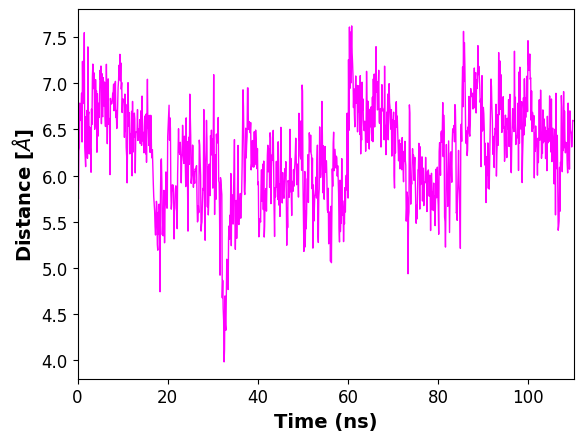

In [ ]:
#@title **Compute distance between the ligand and specific residues 5 angtrom from riostamycin**
#@markdown **Provide output file names below:**
Output_name = 'distance_select' #@param {type:"string"}
#@markdown **Type the number of residues separated by commas and without spaces (1,2,3...):**
Residues = '11,12,14,15,18,32,57,58,59,61,62,63,64,67,68,74,75,76' #@param {type:"string"}
from statistics import mean, stdev
import matplotlib.pyplot as plt
import pandas as pd


mask = ":LIG :" + str(Residues)
dist = pt.distance(traj_load, mask)
print("Selected residues = " + Residues + "\n")
dist_mean = mean(dist)
dist_stdev = stdev(dist)
print("Distance Average = " + str("{:.2f}".format(dist_mean)) + " \u00B1 " + str("{:.2f}".format(dist_stdev)) + " Å")

time = len(dist)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, dist, alpha=1, color = 'magenta', linewidth = 1.0)
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("Distance [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(dist)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

Selected residues = 12,14,15,18,61,62,63,64,67,74,76,100,102,163,164,165,166,167,168,170

Distance Average = 5.15 ± 0.39 Å


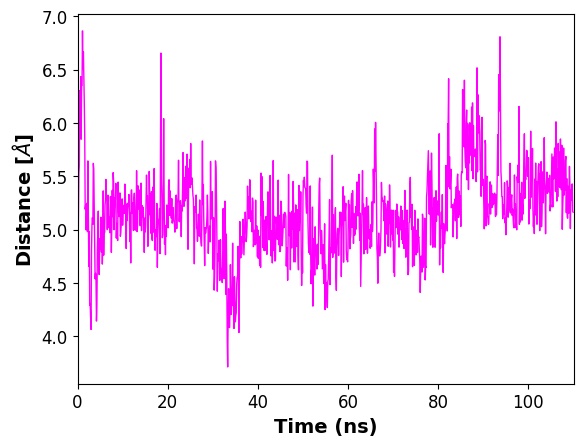

In [ ]:
#@title **Compute distance between the ligand and specific residues 5 angtrom from riostamycin**
#@markdown **Provide output file names below:**
Output_name = 'distance_select1' #@param {type:"string"}
#@markdown **Type the number of residues separated by commas and without spaces (1,2,3...):**
Residues = '12,14,15,18,61,62,63,64,67,74,76,100,102,163,164,165,166,167,168,170' #@param {type:"string"}

mask = ":LIG :" + str(Residues)
dist = pt.distance(traj_load, mask)
print("Selected residues = " + Residues + "\n")
dist_mean = mean(dist)
dist_stdev = stdev(dist)
print("Distance Average = " + str("{:.2f}".format(dist_mean)) + " \u00B1 " + str("{:.2f}".format(dist_stdev)) + " Å")

time = len(dist)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, dist, alpha=1, color = 'magenta', linewidth = 1.0)
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("Distance [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(dist)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

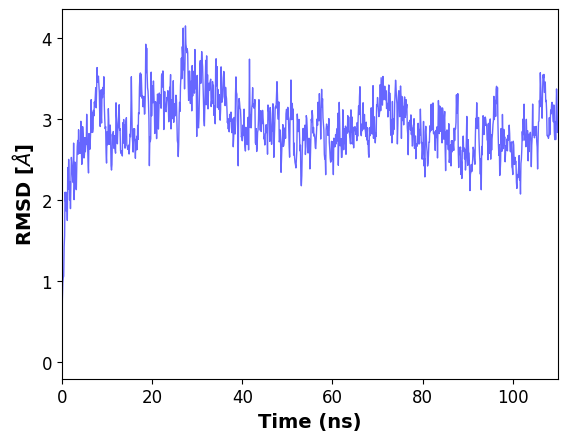

In [ ]:
#@title **Compute RMSD of protein's CA atoms**
#@markdown **Provide output file names below:**
Output_name = 'rmsd_ca' #@param {type:"string"}


rmsd = pt.rmsd(traj_load, ref = 0, mask = "@CA")

time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, rmsd, alpha=0.6, color = 'blue', linewidth = 1.0)
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSD [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(rmsd)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

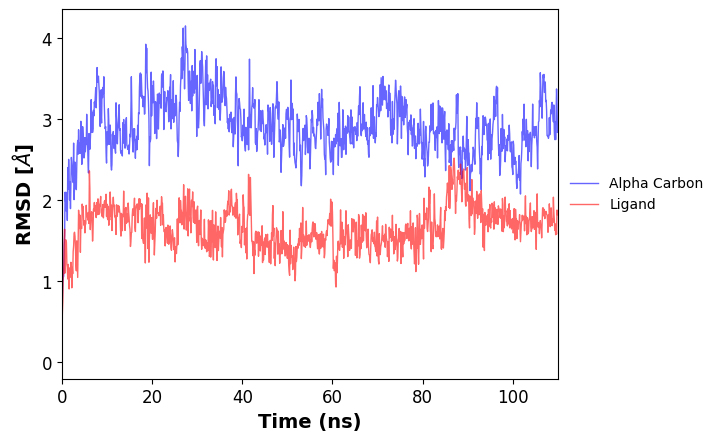

In [ ]:
#@title **Compute RMSD of protein's CA atoms and ligand**
#@markdown **Provide output file names below:**
Output_name = 'rmsd_ca_and_ligand' #@param {type:"string"}


rmsd = pt.rmsd(traj_load, ref = 0, mask = "@CA")
rmsd1 = pt.rmsd(traj_load, ref = 0, mask = ":LIG")

time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, rmsd, alpha=0.6, color = 'blue', linewidth = 1.0, label= "Alpha Carbon")
ax = plt.plot(time_array, rmsd1, alpha=0.6, color = 'red', linewidth = 1.0, label= "Ligand")
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSD [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(rmsd)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

In [ ]:
#@title **Compute RMSD of protein's CA atoms and ligand and AHBA**
#@markdown **Provide output file names below:**
Output_name = 'rmsd_ca_and_ligand_and_AHBA' #@param {type:"string"}
rmsd = pt.rmsd(traj_load, ref = 0, mask = "@CA")
plt.figure(figsize=(w, h), dpi=d)
time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)
plt.subplot(211)
# Plotting:
fig , ax1 = plt.subplots()
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

ax = plt.plot(time_array, rmsd, alpha=0.6, color = 'blue', linewidth = 1.0, label= "Alpha Carbon")
ax = plt.plot(time_array, rmsd1, alpha=0.6, color = 'red', linewidth = 1.0, label= "Ligand")

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSD [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(frameon=False, loc='center left', bbox_to_anchor=(1.25, 0.5))
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')
# move ticks
plt.tick_params(axis='y', which='both', labelleft=False, labelright=True)
ax2 = ax1.twinx()

radgyr = pt.radgyr(traj_load, mask = ":12,14,15,18,61,62,63,64,67,74,76,100,102,163,164,165,166,167,168,170")
time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
plt.plot(time_array, radgyr, alpha=0.6, color = 'green', linewidth = 1.0, label= "ROG")
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

# show plot
plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("distance ($\AA$)", fontsize = 14, fontweight = 'bold' , labelpad=15, rotation= 270 )
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')
plt.legend(frameon=False, loc='center left', bbox_to_anchor=(1.25, 0.6))


NameError: ignored

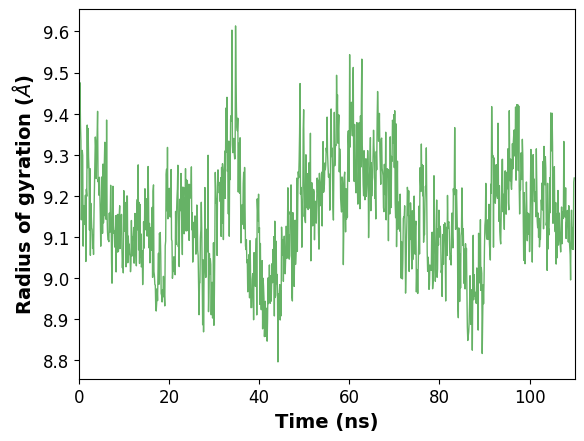

In [ ]:
#@title **Compute radius of gyration of protein's CA atoms**
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(0)
#@markdown **Provide output file names below:**
Output_name = 'radius_gyration' #@param {type:"string"}

radgyr = pt.radgyr(traj_load, mask = ":12,14,15,18,61,62,63,64,67,74,76,100,102,163,164,165,166,167,168,170")
time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
plt.plot(time_array, radgyr, alpha=0.6, color = 'green', linewidth = 1.0)
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

# show plot
plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("Radius of gyration ($\AA$)", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')


raw_data=pd.DataFrame(radgyr)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

AttributeError: ignored

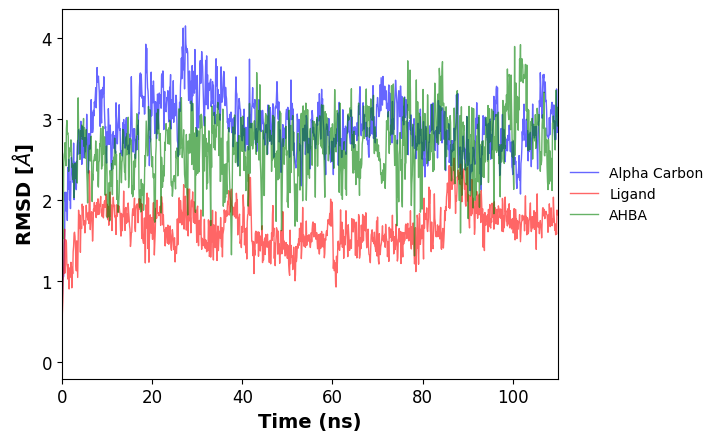

In [ ]:
#@title **Compute RMSD of protein's CA atoms and ligand and AHBA**
#@markdown **Provide output file names below:**
Output_name = 'rmsd_ca_and_ligand_and_AHBA' #@param {type:"string"}


rmsd = pt.rmsd(traj_load, ref = 0, mask = "@CA")
rmsd1 = pt.rmsd(traj_load, ref = 0, mask = ":LIG")
rmsd2 = pt.rmsd(traj_load, ref = 0, mask = ":UNK")

time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, rmsd, alpha=0.6, color = 'blue', linewidth = 1.0, label= "Alpha Carbon")
ax = plt.plot(time_array, rmsd1, alpha=0.6, color = 'red', linewidth = 1.0, label= "Ligand")
ax = plt.plot(time_array, rmsd2, alpha=0.6, color = 'green', linewidth = 1.0, label= "AHBA")
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSD [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend(frameon=False, loc='center left', bbox_to_anchor=(1, 0.5))
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')
ax2 = ax.twinx()
raw_data=pd.DataFrame(rmsd)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

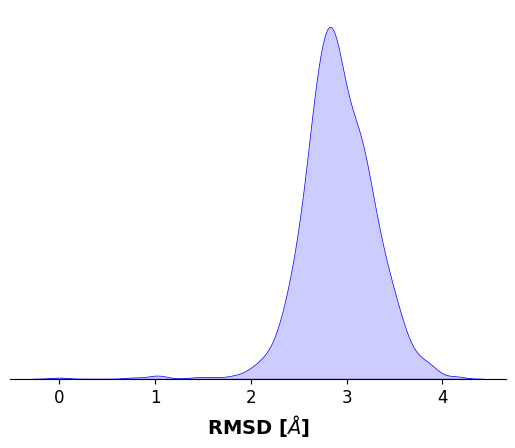

In [ ]:
#@title **Plot RMSD as a ditribution**

#@markdown **Provide output file names below:**
Output_name = 'rmsd_dist' #@param {type:"string"}

ax = sb.kdeplot(rmsd, color="blue", shade=True, alpha=0.2, linewidth=0.5)
plt.xlabel('RMSD [$\AA$]', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks([])
plt.ylabel('')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

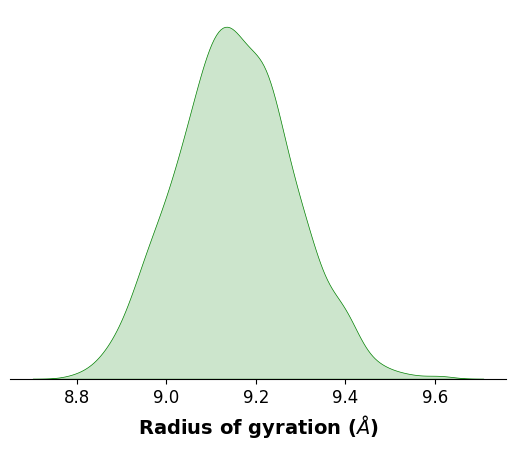

In [ ]:
#@title **Plot radius of gyration as a ditribution**

#@markdown **Provide output file names below:**
Output_name = 'radius_gyration_dist' #@param {type:"string"}

ax = sb.kdeplot(radgyr, color="green", shade=True, alpha=0.2, linewidth=0.5)
plt.xlabel('Radius of gyration ($\AA$)', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks([])
plt.ylabel('')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

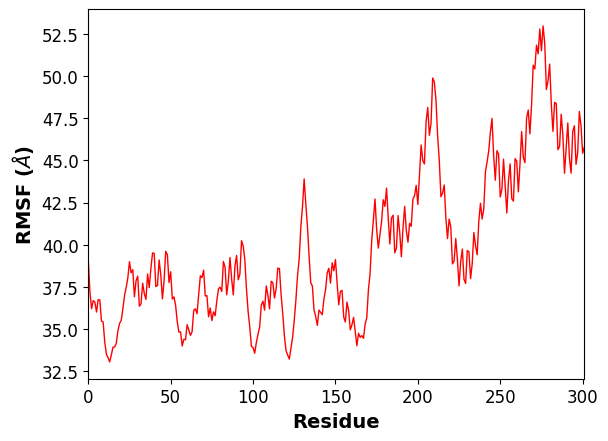

In [ ]:
#@title **Compute RMSF of protein's CA atoms**

#@markdown **Provide output file names below:**
Output_name = 'rmsf_ca' #@param {type:"string"}


rmsf = pt.rmsf(traj_load, "@CA")
bfactor = pt.bfactors(traj_load, byres=True)

# Plotting:
plt.plot(rmsf[:,1], alpha=1.0, color = 'red', linewidth = 1.0)

plt.xlabel("Residue", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSF ($\AA$)", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.xlim(0, len(rmsf[:-1]))

#plt.xticks(np.arange(min(rmsf[:1]), max(rmsf[:1])))
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(rmsf)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

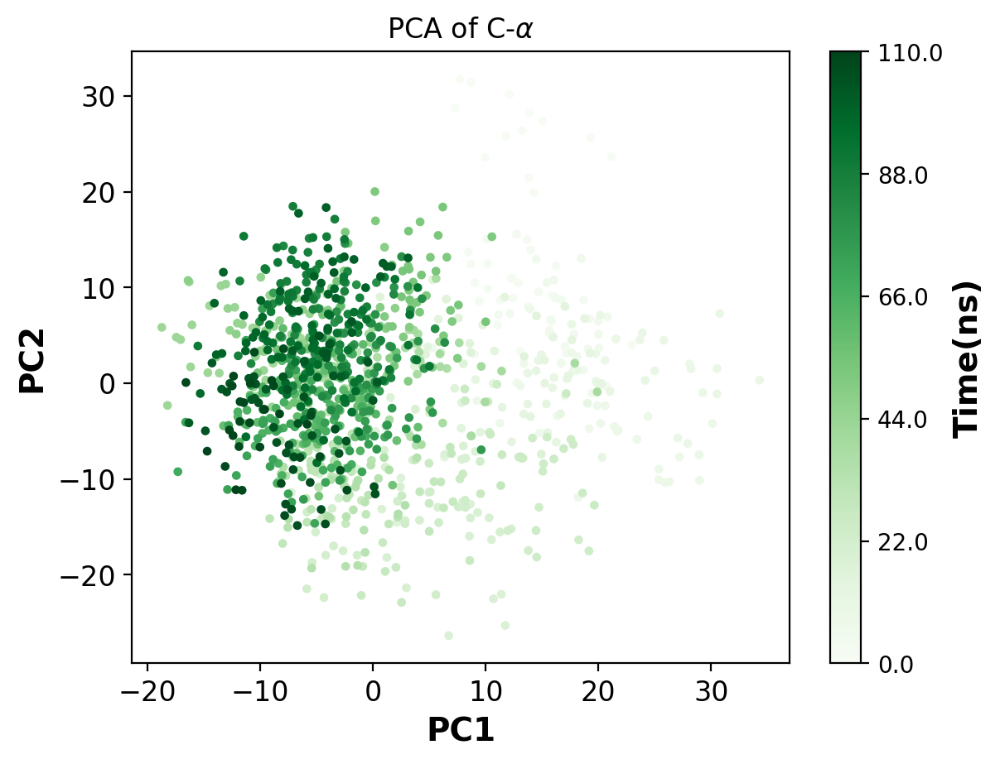

In [ ]:
#@title **Calculate eigvenctors of Principle Component Analysis (PCA)**
data = pt.pca(traj_load, fit=True, ref=0, mask='@CA', n_vecs=2)
#print('projection values of each frame to first mode = {} \n'.format(data[0][0]))
#print('projection values of each frame to second mode = {} \n'.format(data[0][1]))
#print('eigvenvalues of first two modes', data[1][0])
#print("")
#print('eigvenvectors of first two modes: \n', data[1][1])

last_frame = len(time_array)

stride_ticks_f = (last_frame)/5
ticks_frame = np.arange(0,(len(time_array) + float(stride_ticks_f)), float(stride_ticks_f))
a = ticks_frame.astype(float)
a2 = a.tolist()
stride_ticks_t = (simulation_ns)/5
tick_time = np.arange(0,(float(simulation_ns) + float(stride_ticks_t)), float(stride_ticks_t))
b = tick_time.astype(float)

#@markdown **Provide output file names below:**
Output_name = 'PCA' #@param {type:"string"}

Output_PC1 = 'PC1' #@param {type:"string"}
Output_PC2 = 'PC2' #@param {type:"string"}

%matplotlib inline
%config InlineBackend.figure_format = 'retina'  # high resolution
projection_data = data[0]
plt.title(r'PCA of C-$\alpha$')
PC1 = data[0][0]
PC2 = data[0][1]

a = plt.scatter(PC1,PC2, c=range(int(number_frames_analysis)), cmap='Greens', marker='o',s=8, alpha=1)
plt.clim(0, last_frame)

plt.xlabel('PC1', fontsize = 14, fontweight = 'bold')
plt.ylabel('PC2', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
# N = len(number_frames)
# x2 = np.arange(N)

cbar1 = plt.colorbar(a, orientation="vertical")
cbar1.set_label('Time(ns)', fontsize = 14, fontweight = 'bold')
cbar1.set_ticks(a2)
cbar1.set_ticklabels(b.round(decimals=3))

plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

pc1=pd.DataFrame(PC1)
pc1.to_csv(os.path.join(workDir, Output_PC1 + ".csv"))
pc2=pd.DataFrame(PC2)
pc2.to_csv(os.path.join(workDir, Output_PC2 + ".csv"))

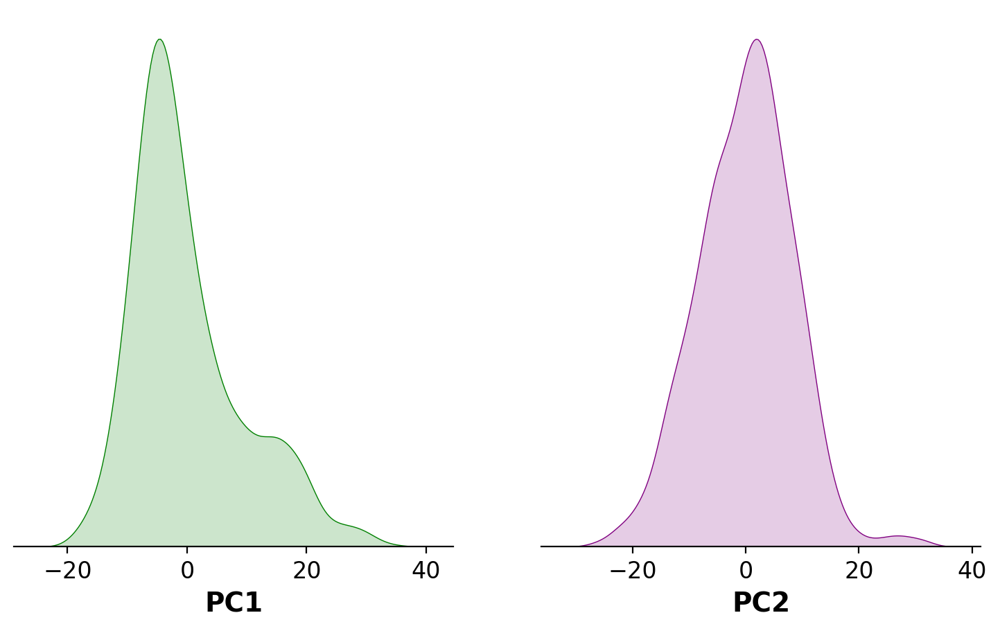

In [ ]:
#@title **Plot Principal Component 1 (PC1) and Principal Component 2 (PC2) as a ditribution**
Output_name = 'PCA_dist' #@param {type:"string"}


fig = plt.figure(figsize=(9,5))

plt.subplot(1, 2, 1)
ax = sb.kdeplot(PC1, color="green", shade=True, alpha=0.2, linewidth=0.5)
plt.xlabel('PC1', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks([])
plt.ylabel('')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)
plt.subplot(1, 2, 2)
ax2 = sb.kdeplot(PC2, color="purple", shade=True, alpha=0.2, linewidth=0.5)
plt.xlabel('PC2', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks([])
plt.ylabel('')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(True)
ax2.spines['left'].set_visible(False)


plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

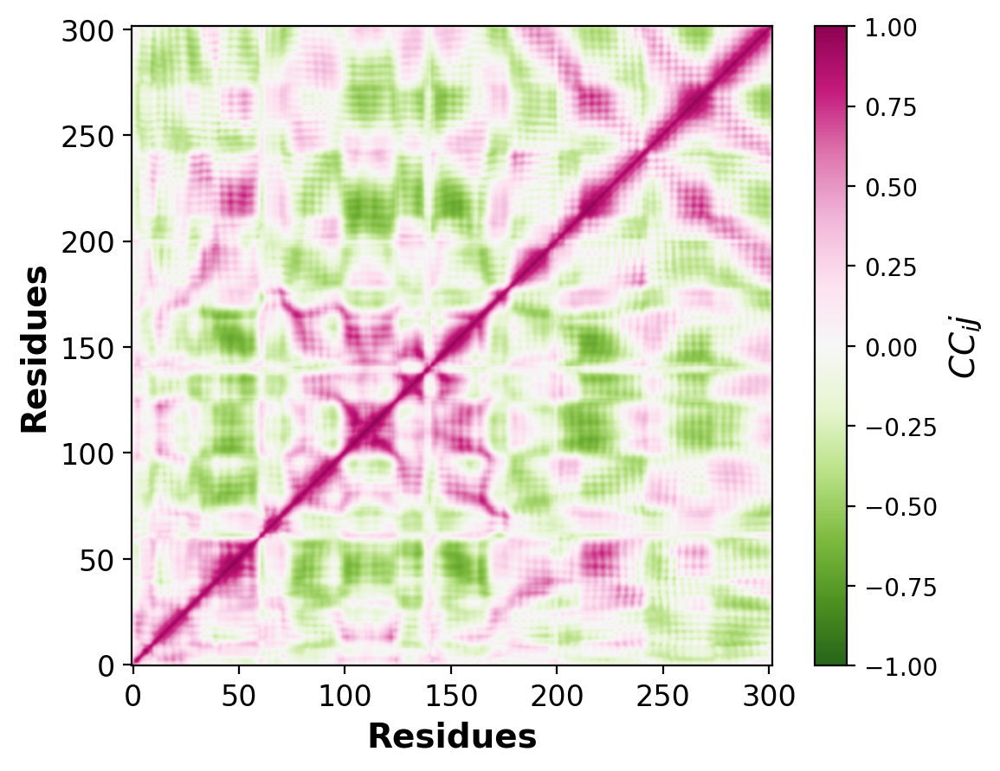

In [ ]:
#@title **Pearson's Cross Correlation (CC)**

#@markdown **Provide output file names below:**
Output_name = 'cross_correlation' #@param {type:"string"}


traj_align = pt.align(traj_load, mask='@CA', ref=0)

mat_cc = matrix.correl(traj_align, '@CA')

ax = plt.imshow(mat_cc, cmap = 'PiYG_r', interpolation = 'bicubic', vmin = -1, vmax = 1, origin='lower')

plt.xlabel('Residues', fontsize = 14, fontweight = 'bold')
plt.ylabel('Residues', fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
cbar1 = plt.colorbar()
cbar1.set_label('$CC_ij$', fontsize = 14, fontweight = 'bold')

plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(mat_cc)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))